In [9]:
import pandas as pd #for importing csv
import numpy as np
import matplotlib.pyplot as plt #for plotting EDA
import os #to navigate to csv files
#from plotnine import ggplot, aes, geom_bar, theme_classic, ggtitle, labs
import seaborn as sns

In [10]:
#change directory
print(os.getcwd())
os.chdir(path=f"C:/Users/engli/Documents/Y2S1/NSPC2001/Mini_VinDr_CXR_Dataset/original_dataset/annotations")
print(os.getcwd())

#get list of csvs in dir
print(os.listdir())
csvList = os.listdir()

#printing csvList items
for csv in csvList:
    print(csv)

C:\Users\engli\Documents\Y2S1\NSPC2001\Mini_VinDr_CXR_Dataset\original_dataset\annotations
C:\Users\engli\Documents\Y2S1\NSPC2001\Mini_VinDr_CXR_Dataset\original_dataset\annotations
['annotations_test.csv', 'annotations_train.csv', 'mini_image_labels_test.csv', 'mini_image_labels_train.csv']
annotations_test.csv
annotations_train.csv
mini_image_labels_test.csv
mini_image_labels_train.csv


In [11]:
try:
    annoTest = pd.read_csv("annotations_test.csv")
    print(annoTest.to_string())
    annoTrain = pd.read_csv("annotations_train.csv")
    print("\n", annoTrain.to_string())
except FileNotFoundError:
    print("File not found, check directory")

                              image_id          class_name        x_min        y_min        x_max        y_max
0     e0dc2e79105ad93532484e956ef8a71a       Calcification  1221.560976   661.580417  1343.298780   783.318222
1     e0dc2e79105ad93532484e956ef8a71a        Cardiomegaly   638.695122  1310.848710  1800.737805  1937.982856
2     e0dc2e79105ad93532484e956ef8a71a                 ILD  1693.756098  1392.007246  1929.853659  1941.671881
3     e0dc2e79105ad93532484e956ef8a71a        Pneumothorax   399.924053   145.803282  1016.600328   510.138208
4     e0dc2e79105ad93532484e956ef8a71a        Pneumothorax   334.300846   493.762382   453.145487   744.509170
5     e0dc2e79105ad93532484e956ef8a71a    Pleural effusion   229.975703  1482.203045   644.450374  1945.701602
6     e0dc2e79105ad93532484e956ef8a71a         Atelectasis   379.275719  1248.225409   504.063792  1500.029913
7     e0dc2e79105ad93532484e956ef8a71a        Pneumothorax   283.456305  1381.926915   414.929454  1546.825440
8

<Axes: >

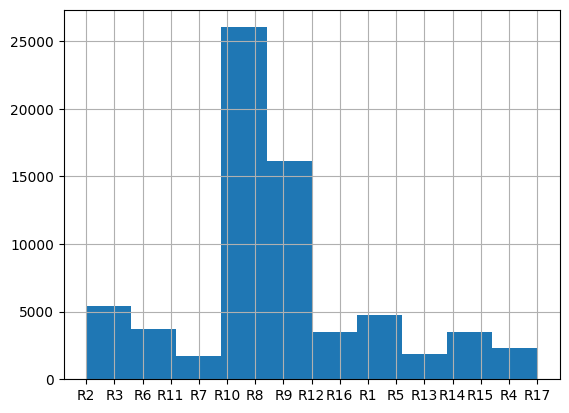

In [12]:
#EDA on radiologists

len(annoTrain)
annoTrain["rad_id"].hist()

#R8, R9, R10 seem to have made the most contributions - what if we focus on the three radiologists?

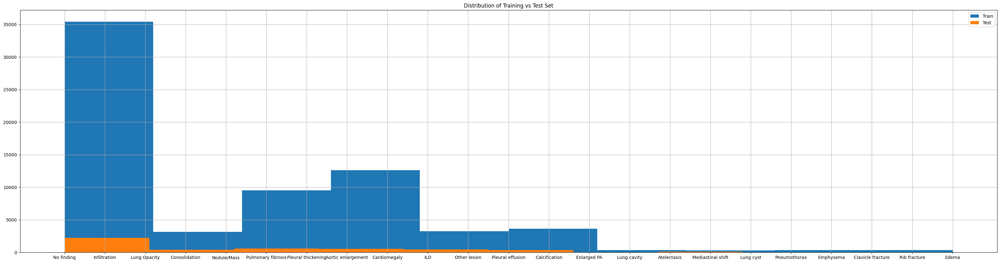

In [13]:
#distribution of observations
annoTrain["class_name"].hist(figsize = (40,10), label = "Train")

#what if we chop out everything from lung cavity onwards?

annoTest["class_name"].hist(figsize = (40,10), label = "Test")

plt.title("Distribution of Training vs Test Set")

plt.legend(loc = "upper right")

In [14]:
#number of unique images that have something wrong with them is 4522 in train dataset
annoTrain.loc[annoTrain["class_name"]!= "No finding"].nunique()

#number of unique images that have something wrong with them is 949 in train dataset
annoTest.loc[annoTest["class_name"]!= "No finding"].nunique()

image_id       949
class_name      21
x_min         2693
y_min         2688
x_max         2689
y_max         2688
dtype: int64

In [18]:
convertedTrain = pd.read_csv("C:/Users/engli/Documents/Y2S1/NSPC2001/Mini_VinDr_CXR_Dataset/FULL_1024_PAD_annotations/anno_train.csv")
convertedTest = pd.read_csv("C:/Users/engli/Documents/Y2S1/NSPC2001/Mini_VinDr_CXR_Dataset/FULL_1024_PAD_annotations/anno_test.csv")

combinedDf = pd.concat((convertedTrain, convertedTest))

conditionList = (combinedDf["class_name"].unique())
print(conditionList)

heartCond = ["Cardiomegaly", "Enlarged PA"]
aortaCond = ["Aortic enlargement"]
anywhereCond = ["Calcification", "Other lesion"]
fractureCond = ["Clavicle fracture", "Rib fracture"]
mediastinalCond = ["Mediastinal shift"]
lungCond = [x for x in conditionList if x not in (heartCond + aortaCond + anywhereCond + fractureCond + mediastinalCond + ["No finding"])]

['No finding' 'Infiltration' 'Lung Opacity' 'Consolidation' 'Nodule/Mass'
 'Pulmonary fibrosis' 'Pleural thickening' 'Aortic enlargement'
 'Cardiomegaly' 'ILD' 'Other lesion' 'Pleural effusion' 'Calcification'
 'Enlarged PA' 'Lung cavity' 'Atelectasis' 'Mediastinal shift' 'Lung cyst'
 'Pneumothorax' 'Emphysema' 'Clavicle fracture' 'Rib fracture' 'Edema']


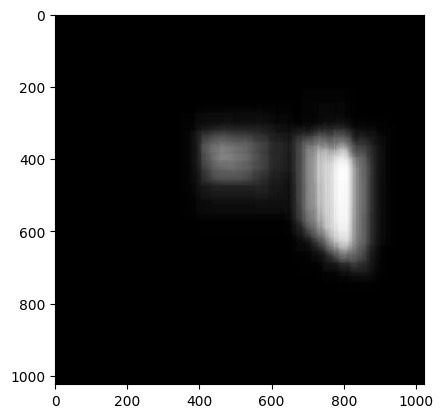

In [19]:
#https://stackoverflow.com/questions/51341091/temperature-is-black-after-thresholding
def makeHeatmap(dimensions, conditions, pandasdf):

    subset = pandasdf[pandasdf["class_name"].isin(conditions)]
    heatmap = np.zeros(dimensions, dtype = float)

    for row in subset.itertuples(index = False):
        heatmap[int(row.x_min):int(row.y_min), int(row.x_max):int(row.y_max)] += 1
    
    plt.imshow(heatmap, cmap = "Greys_r",interpolation="nearest")
    plt.show()
    
makeHeatmap((1024, 1024), heartCond, combinedDf)

<function matplotlib.pyplot.show(close=None, block=None)>

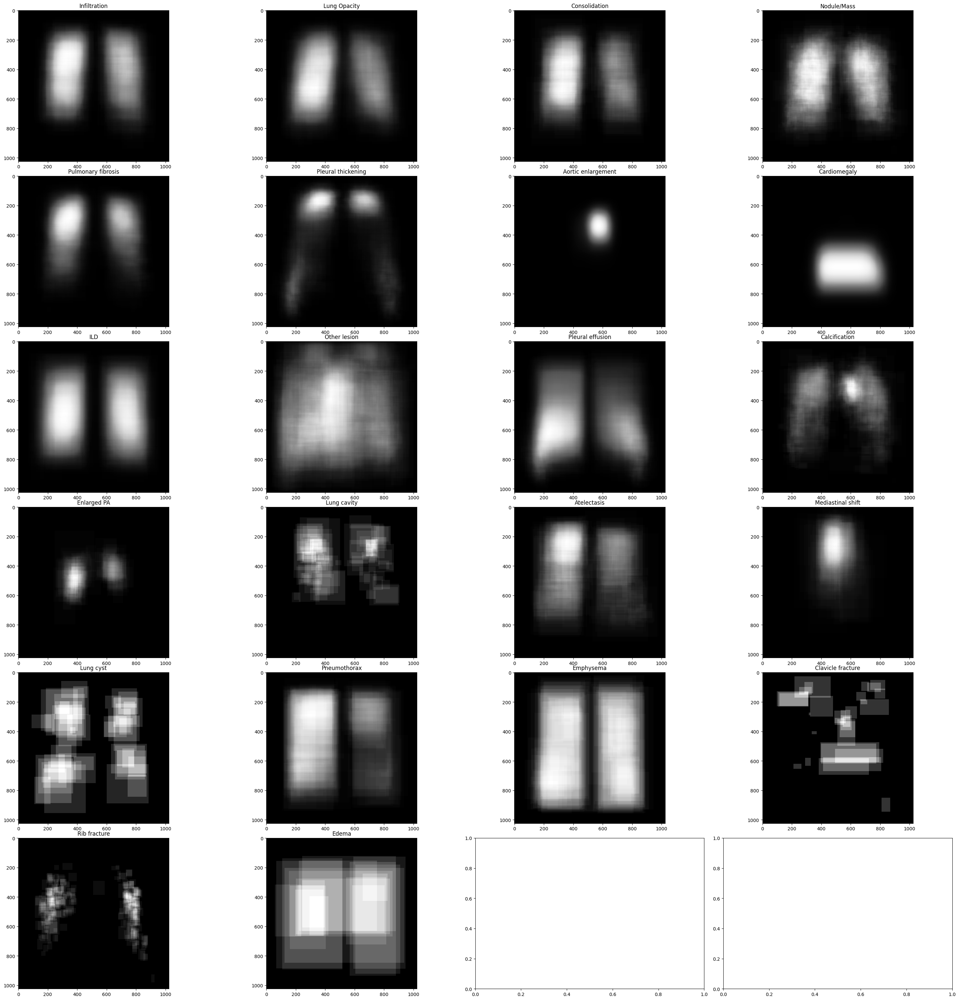

In [20]:
#https://stackoverflow.com/questions/51341091/temperature-is-black-after-thresholding

fig, ax = plt.subplots(nrows = 6, ncols = 4, figsize = (30,30))
#plt.subplots_adjust(hspace=0.5)
fig.tight_layout()

conditionList = [x for x in conditionList if x != "No finding"]

for condition, ax in zip(conditionList, ax.ravel()):
    subset = combinedDf[combinedDf["class_name"] == condition]
    heatmap = np.zeros((1024, 1024), dtype = float)

    for row in subset.itertuples(index = False):
        heatmap[int(row.y_min):int(row.y_max), int(row.x_min):int(row.x_max)] += 1
    heatmap = (heatmap-np.min(heatmap))/(np.max(heatmap)-np.min(heatmap))
    
    ax.imshow(heatmap, cmap = "Greys_r",interpolation="nearest")
    ax.set_title(condition)
    
plt.show

It looks like there may be some issues with clavicle fracture

In [23]:
print(combinedDf.loc[combinedDf["class_name"] == "Clavicle fracture"])

       Unnamed: 0                          image_id rad_id         class_name  \
1013         1013  0391d2388a2442f14d055d5089a747c6    R10  Clavicle fracture   
7003         7003  1aaa4b217affae30113bd3a7a384a4c7    R10  Clavicle fracture   
7714         7714  1d37efa5bcce26d6cc9a224f99db3f0e    R10  Clavicle fracture   
9025         9025  2271647c6cb51cd088392c184f8be135    R10  Clavicle fracture   
9834         9834  258b0025af766aa2a485e3221da4b46e    R10  Clavicle fracture   
10154       10154  268ed28c6d57f5d5383cd5cf8e62e457    R10  Clavicle fracture   
12498       12498  2f35a721ceb1f89cbbd33ade57b32f4e     R9  Clavicle fracture   
15013       15013  37969967243726a9e231291224502076    R10  Clavicle fracture   
15386       15386  38e8d0a7c6e90bb221619d0d8836b3a8     R9  Clavicle fracture   
20259       20259  4bd2c3d9e7b1e62d3b55d858b5dca1a0    R10  Clavicle fracture   
28426       28426  6a245106cf0448251656a6a0bd6aebd5     R8  Clavicle fracture   
31173       31173  742d73529

In [ ]:
#combinedDf contains annotations from both datasets